# Housing Project

**A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses
data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same
purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file
below.
The company is looking at prospective properties to buy houses to enter the market. You are required to build a model
using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest
in them or not. For this company wants to know:
• Which variables are important to predict the price of variable?
• How do these variables describe the price of the house?**

Business Goals:
    
    You are required to model the price of houses with the available independent variables. This model will then be used
    by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the
    strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for 
    the management to understand the pricing dynamics of a new market.

# Importing the required libraries

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from heatmap import heatmap,corrplot
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from sklearn.linear_model import RANSACRegressor
from sklearn.linear_model import Ridge,Lasso,ElasticNet
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import SGDRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR
import warnings
warnings.filterwarnings('ignore')

In [57]:
import pandas as pd
pd.set_option('display.max_columns',None)

# Importing the dataset

In [3]:
df=pd.read_csv('Housing Project.csv')

# Getting a basic outlook over the dataset

In [4]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


In [5]:
df.shape

(1168, 81)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

Observations:
    
    1.There are null values in the dataset

In [7]:
df.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      214
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64

In [8]:
df.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1163,289,20,RL,NaN,9819,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,5,1967,1967,Gable,CompShg,MetalSd,MetalSd,BrkFace,31.0,TA,Gd,CBlock,TA,TA,No,BLQ,450,Unf,0,432,882,GasA,TA,Y,SBrkr,900,0,0,900,0,0,1,0,3,1,TA,5,Typ,0,NaN,Detchd,1970.0,Unf,1,280,TA,TA,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,122000
1164,554,20,RL,67.0,8777,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Feedr,Norm,1Fam,1Story,4,5,1949,2003,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,Ex,Y,SBrkr,1126,0,0,1126,0,0,2,0,2,1,Gd,5,Typ,0,NaN,Detchd,2002.0,Fin,2,520,TA,TA,N,0,96,0,0,0,0,NaN,MnPrv,NaN,0,5,2009,WD,Normal,108000
1165,196,160,RL,24.0,2280,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,NPkVill,Norm,Norm,Twnhs,2Story,6,6,1976,1976,Gable,CompShg,Plywood,Brk Cmn,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,566,Unf,0,289,855,GasA,TA,Y,SBrkr,855,601,0,1456,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1976.0,Unf,2,440,TA,TA,Y,87,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal,148500
1166,31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Feedr,Norm,1Fam,2Story,4,4,1920,1950,Gambrel,CompShg,BrkFace,BrkFace,None,0.0,TA,Fa,BrkTil,TA,TA,No,Unf,0,Unf,0,649,649,GasA,TA,N,SBrkr,649,668,0,1317,0,0,1,0,3,1,TA,6,Typ,0,NaN,Detchd,1920.0,Unf,1,250,TA,Fa,N,0,54,172,0,0,0,NaN,MnPrv,NaN,0,7,2008,WD,Normal,40000
1167,617,60,RL,NaN,7861,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,2002,2003,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,457,Unf,0,326,783,GasA,Ex,Y,SBrkr,807,702,0,1509,1,0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,2002.0,Fin,2,393,TA,TA,Y,100,75,0,0,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal,183200


Observations:
    
    1.There are 81 variables, lets go for exploratory data analysis by keeping the aim of the project in the mind.
    2.Our primary aim of exploratory data analysis are of follows:
        A.Which variables are important to predict the price of the variable
        B.How do these variables describe the price of the house
        C.Model to predict the housing price
        D.Need to find which and all the parameters affects positivey and negatively.

# Exploratory Data Analysis

In [4]:
# making the copy of the data
df1=df.copy()

In [58]:
pd.set_option('display.max_rows',None)

In [18]:
df.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


In [19]:
# We have to seperate out categorical variable and label encode it

In [20]:
df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [21]:
# we can drop id column as it just an representation.

In [6]:
df1.drop('Id',axis=1,inplace=True)

In [7]:
df1.shape

(1168, 80)

In [8]:
categorical=[]
non_categorical=[]
for i in df1.columns:
    if df1[i].dtype=='object':
        categorical.append(i)
    elif df1[i].dtype=="int64":
        non_categorical.append(i)
    else:
        non_categorical.append(i)

In [9]:
len(categorical)

43

In [10]:
len(non_categorical)

37

In [34]:
#checking whether all categorical columns are actually true:
for i in categorical:
    print(i)
    user=input('is it a categorical column?')
    for j in user:
        if j=='y':
            pass
        elif j=='n':
            categorical.remove(i)  

MSZoning
is it a categorical column?y
Street
is it a categorical column?y
Alley
is it a categorical column?y
LotShape
is it a categorical column?y
LandContour
is it a categorical column?y
Utilities
is it a categorical column?y
LotConfig
is it a categorical column?y
LandSlope
is it a categorical column?y
Neighborhood
is it a categorical column?
Condition1
is it a categorical column?y
Condition2
is it a categorical column?y
BldgType
is it a categorical column?y
HouseStyle
is it a categorical column?y
RoofStyle
is it a categorical column?y
RoofMatl
is it a categorical column?y
Exterior1st
is it a categorical column?y
Exterior2nd
is it a categorical column?y
MasVnrType
is it a categorical column?y
ExterQual
is it a categorical column?y
ExterCond
is it a categorical column?y
Foundation
is it a categorical column?y
BsmtQual
is it a categorical column?y
BsmtCond
is it a categorical column?y
BsmtExposure
is it a categorical column?y
BsmtFinType1
is it a categorical column?y
BsmtFinType2
is it 

In [11]:
#checking whether all non_categorical columns are actually true:
for i in non_categorical:
    print(i)
    user=input('is it a non_categorical column?')
    for j in user:
        if j=='y':
            pass
        elif j=='n':
            categorical.append(i)
            non_categorical.remove(i) 

MSSubClass
is it a non_categorical column?n
LotArea
is it a non_categorical column?y
OverallQual
is it a non_categorical column?n
YearBuilt
is it a non_categorical column?y
YearRemodAdd
is it a non_categorical column?y
MasVnrArea
is it a non_categorical column?n
BsmtFinSF2
is it a non_categorical column?n
TotalBsmtSF
is it a non_categorical column?y
1stFlrSF
is it a non_categorical column?y
2ndFlrSF
is it a non_categorical column?y
LowQualFinSF
is it a non_categorical column?y
GrLivArea
is it a non_categorical column?y
BsmtFullBath
is it a non_categorical column?y
BsmtHalfBath
is it a non_categorical column?y
FullBath
is it a non_categorical column?y
HalfBath
is it a non_categorical column?y
BedroomAbvGr
is it a non_categorical column?y
KitchenAbvGr
is it a non_categorical column?y
TotRmsAbvGrd
is it a non_categorical column?y
Fireplaces
is it a non_categorical column?y
GarageYrBlt
is it a non_categorical column?y
GarageCars
is it a non_categorical column?y
GarageArea
is it a non_categ

In [12]:
len(categorical)

47

In [13]:
len(non_categorical)

33

In [51]:
#lets label encode all the categorical columns
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

In [15]:
for i in categorical:
    df1[i]=le.fit_transform(df1[i])

In [16]:
df1.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,11,3,NaN,4928,1,2,0,3,0,4,0,13,2,2,4,2,5,5,1976,1976,1,1,8,9,2,0,3,4,1,2,3,3,0,120,5,0,958,1078,1,4,1,4,958,0,0,958,0,0,2,0,2,1,3,5,6,1,4,1,1977.0,1,2,440,4,4,2,0,205,0,0,0,0,3,4,4,0,2,2007,8,4,128000
1,0,3,95.0,15865,1,2,0,3,0,4,1,12,2,2,0,2,7,6,1970,1970,0,5,12,13,2,0,2,2,2,3,1,1,0,351,4,107,1043,2217,1,0,1,4,2217,0,0,2217,1,0,2,0,4,1,2,8,6,1,4,1,1970.0,2,2,621,4,4,2,81,207,0,0,224,0,3,4,4,0,10,2007,8,4,268000
2,5,3,92.0,9920,1,2,0,3,0,1,0,15,2,2,0,5,6,5,1996,1997,1,1,7,7,2,0,2,4,2,2,3,0,2,862,5,0,255,1117,1,0,1,4,1127,886,0,2013,1,0,2,1,3,1,3,8,6,1,4,1,1997.0,2,2,455,4,4,2,180,130,0,0,0,0,3,4,4,0,6,2007,8,4,269790
3,0,3,105.0,11751,1,2,0,3,0,4,0,14,2,2,0,2,5,6,1977,1977,3,1,8,9,1,236,3,4,1,2,3,3,1,705,5,0,1139,1844,1,0,1,4,1844,0,0,1844,0,0,2,0,3,1,3,7,6,1,4,1,1977.0,1,2,546,4,4,2,0,122,0,0,0,0,3,2,4,0,1,2010,0,4,190000
4,0,3,NaN,16635,1,2,0,3,0,2,0,14,2,2,0,2,5,7,1977,2000,1,1,4,4,3,73,2,4,1,2,3,3,0,1246,5,0,356,1602,1,2,1,4,1602,0,0,1602,0,1,2,0,3,1,2,8,6,1,4,1,1977.0,0,2,529,4,4,2,240,0,0,0,0,0,3,4,4,0,6,2009,8,4,215000


Observations:
    
    Right now we made a quite perfect dataset for the analysis purpose

# Finding and Evaluating the parameters which affects the price of a house

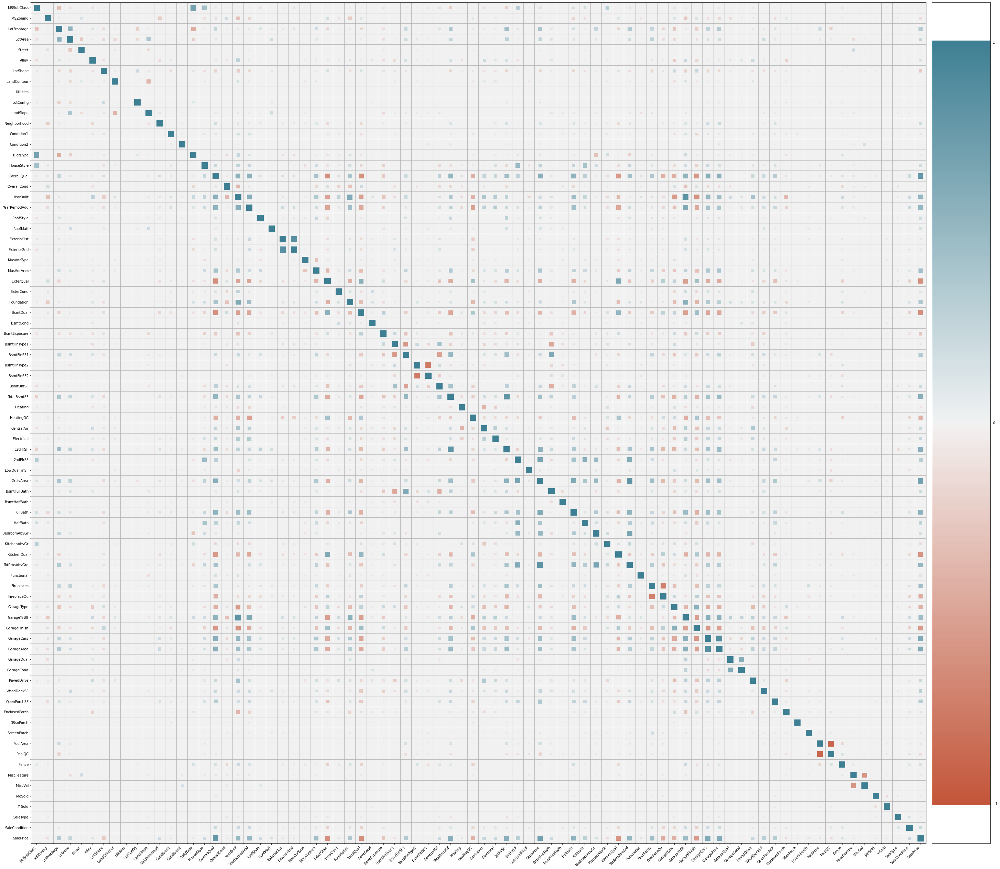

In [41]:
plt.figure(figsize=(50,45))
corrplot(df1.corr(),size_scale=300)
plt.savefig('corrplot.jpg')
plt.show()

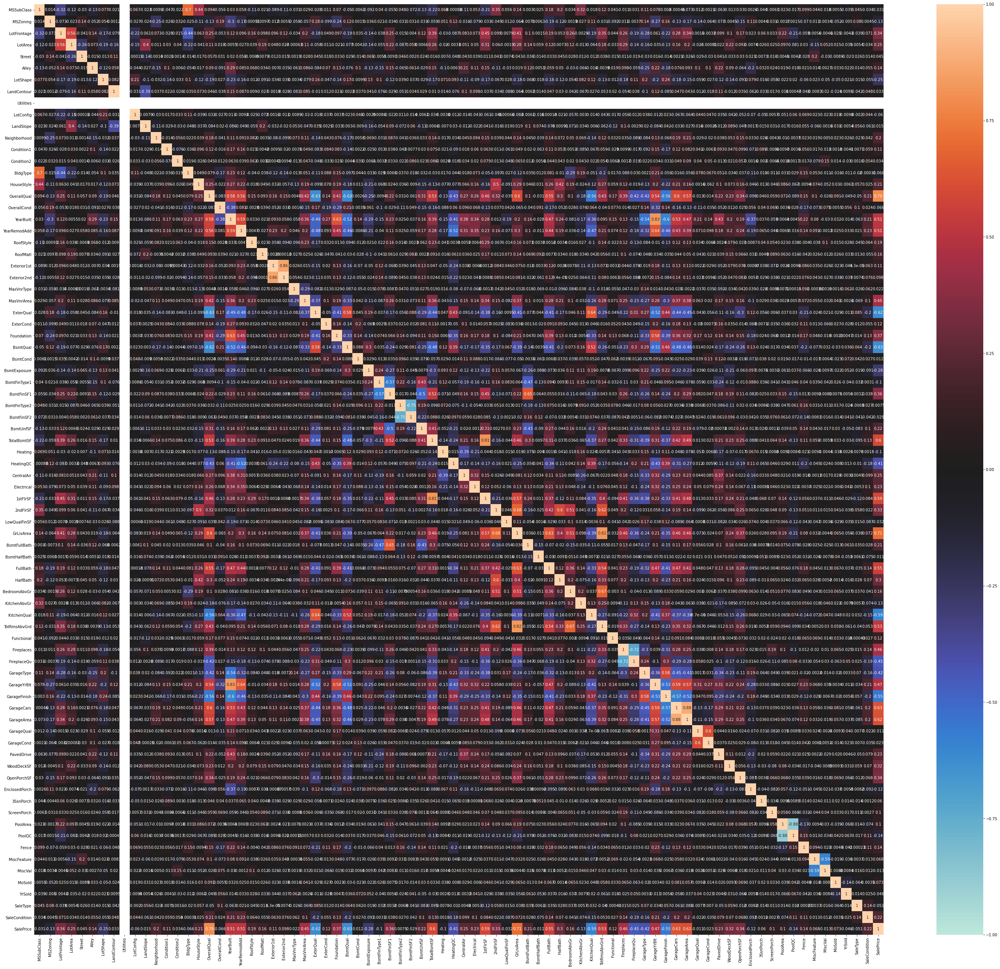

In [42]:
plt.figure(figsize=(50,45))
sns.heatmap(df1.corr(), annot = True, vmin=-1, vmax=1, center= 0)
plt.savefig('House_Heatmap.jpg')
plt.show()

In [44]:
#Sorting the correlation value
corr_matrix=df1.corr()
Descend_corr=corr_matrix['SalePrice'].sort_values(ascending=False)

In [47]:
Descend_corr

SalePrice        1.000000
OverallQual      0.789185
GrLivArea        0.707300
GarageCars       0.628329
GarageArea       0.619000
TotalBsmtSF      0.595042
1stFlrSF         0.587642
FullBath         0.554988
TotRmsAbvGrd     0.528363
YearBuilt        0.514408
YearRemodAdd     0.507831
GarageYrBlt      0.474346
Fireplaces       0.459611
MasVnrArea       0.448804
Foundation       0.374169
BsmtFinSF1       0.362874
LotFrontage      0.341294
OpenPorchSF      0.339500
2ndFlrSF         0.330386
WoodDeckSF       0.315444
HalfBath         0.295592
LotArea          0.249499
CentralAir       0.246754
Electrical       0.234621
PavedDrive       0.231707
SaleCondition    0.217687
BsmtUnfSF        0.215724
BsmtFullBath     0.212924
HouseStyle       0.205502
Neighborhood     0.198942
RoofStyle        0.192654
RoofMatl         0.159865
BedroomAbvGr     0.158281
Fence            0.143922
Alley            0.136664
Functional       0.118673
ExterCond        0.115167
Exterior1st      0.108451
Condition1  

Some of the highly positively correlated variables with sales price


    OverallQual      0.789185
    GrLivArea        0.707300
    GarageCars       0.628329
    GarageArea       0.619000
    TotalBsmtSF      0.595042
    1stFlrSF         0.587642
    FullBath         0.554988
    TotRmsAbvGrd     0.528363
    YearBuilt        0.514408
    YearRemodAdd     0.507831
    GarageYrBlt      0.474346
    Fireplaces       0.459611
    MasVnrArea       0.448804
    Foundation       0.374169
    BsmtFinSF1       0.362874
    LotFrontage      0.341294
    OpenPorchSF      0.339500
    2ndFlrSF         0.330386
    WoodDeckSF       0.315444
    HalfBath         0.295592
    LotArea          0.249499
    CentralAir       0.246754

Some of the highly negatively correlated variables with sales price

    LotShape        -0.248171
    BsmtExposure    -0.282480
    HeatingQC       -0.406604
    GarageType      -0.415370
    FireplaceQu     -0.445910
    GarageFinish    -0.550624
    KitchenQual     -0.592468
    ExterQual       -0.624820
    BsmtQual        -0.628798

In [17]:
df1['Utilities'].value_counts()

0    1168
Name: Utilities, dtype: int64

In [18]:
df['Utilities'].value_counts()

AllPub    1168
Name: Utilities, dtype: int64

Observations:
    
    1.From the above cells we can see that utilities has got only one values so it doesnt affects the result so we can 
    delete this column

In [19]:
df1.drop('Utilities',axis=1,inplace=True)

In [20]:
df1.shape

(1168, 79)

In [21]:
df1.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,11,3,NaN,4928,1,2,0,3,4,0,13,2,2,4,2,5,5,1976,1976,1,1,8,9,2,0,3,4,1,2,3,3,0,120,5,0,958,1078,1,4,1,4,958,0,0,958,0,0,2,0,2,1,3,5,6,1,4,1,1977.0,1,2,440,4,4,2,0,205,0,0,0,0,3,4,4,0,2,2007,8,4,128000
1,0,3,95.0,15865,1,2,0,3,4,1,12,2,2,0,2,7,6,1970,1970,0,5,12,13,2,0,2,2,2,3,1,1,0,351,4,107,1043,2217,1,0,1,4,2217,0,0,2217,1,0,2,0,4,1,2,8,6,1,4,1,1970.0,2,2,621,4,4,2,81,207,0,0,224,0,3,4,4,0,10,2007,8,4,268000
2,5,3,92.0,9920,1,2,0,3,1,0,15,2,2,0,5,6,5,1996,1997,1,1,7,7,2,0,2,4,2,2,3,0,2,862,5,0,255,1117,1,0,1,4,1127,886,0,2013,1,0,2,1,3,1,3,8,6,1,4,1,1997.0,2,2,455,4,4,2,180,130,0,0,0,0,3,4,4,0,6,2007,8,4,269790
3,0,3,105.0,11751,1,2,0,3,4,0,14,2,2,0,2,5,6,1977,1977,3,1,8,9,1,236,3,4,1,2,3,3,1,705,5,0,1139,1844,1,0,1,4,1844,0,0,1844,0,0,2,0,3,1,3,7,6,1,4,1,1977.0,1,2,546,4,4,2,0,122,0,0,0,0,3,2,4,0,1,2010,0,4,190000
4,0,3,NaN,16635,1,2,0,3,2,0,14,2,2,0,2,5,7,1977,2000,1,1,4,4,3,73,2,4,1,2,3,3,0,1246,5,0,356,1602,1,2,1,4,1602,0,0,1602,0,1,2,0,3,1,2,8,6,1,4,1,1977.0,0,2,529,4,4,2,240,0,0,0,0,0,3,4,4,0,6,2009,8,4,215000


In [80]:
df1.to_csv('Housing_Label_Encoded.csv')

**1. SalePrice  vs  OverallQual**

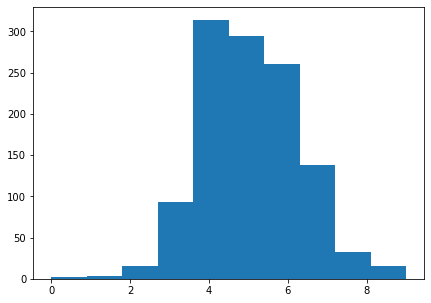

In [32]:
plt.figure(figsize=(7,5))
plt.hist(df1['OverallQual'],bins=10,histtype='bar')
plt.show()

<AxesSubplot:xlabel='OverallQual', ylabel='count'>

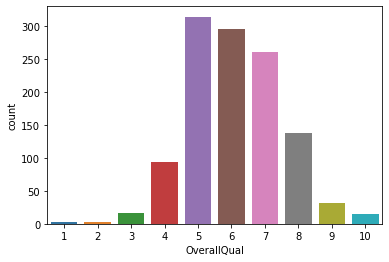

In [33]:
sns.countplot(df['OverallQual'])

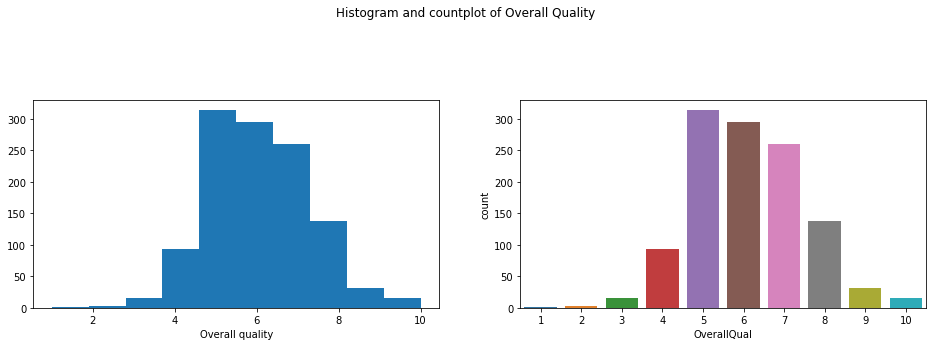

In [55]:
fig=plt.figure(figsize=(16,13))
ax1=fig.add_subplot(321)
ax2=fig.add_subplot(322)
ax1.hist(df1['OverallQual'],bins=10,histtype='bar')
ax1.set_xlabel('Overall quality')
ax2=sns.countplot(df1['OverallQual'])
plt.suptitle('Histogram and countplot of Overall Quality')
plt.show()

In [50]:
import altair as alt
chart=alt.Chart(df1).mark_point().encode(
x='SalePrice',
y='OverallQual')
chart

alt.Chart(...)

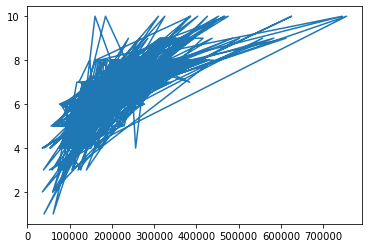

In [51]:
plt.plot(df1['SalePrice'],df1['OverallQual'])

In [35]:
import chart_studio.plotly as py
import plotly.express as px
import cufflinks as cf
import plotly.graph_objects as go
%matplotlib inline
from plotly.offline import download_plotlyjs, init_notebook_mode,plot
init_notebook_mode(connected=True)
cf.go_offline()

In [28]:
px.scatter(df1,x='SalePrice',y='OverallQual',labels={'x':'sales price','y':'overall quality'},title='overall quality vs sales price')

       10   Very Excellent
       9	Excellent
       8	Very Good
       7	Good
       6	Above Average
       5	Average
       4	Below Average
       3	Fair
       2	Poor
       1	Very Poor

Observations:
    
    1.Most of the data falls from the category Average to Very good
    2.The overall quality vs sales price seems to vary linearly but it slightly follows an curve shape
    3.According to data the price for the different quality ranges as follows:
        
        
        Sl.no    Quality       Range
        1       Very poor      30k to 60k
        2       Poor           30k to 60k
        3       Fair           38k to 139k
        4       Below Average  34k to 176k
        5       Average        55k to 229k
        6       Above average  76k to 277k
        7       Good           116k to 341k
        8       Very Good      147k to 440k
        9       Excellent      239k to 612k
        10      Very Excellent 310k to 755k
        

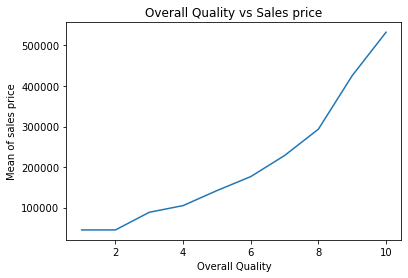

In [58]:
plt.plot([1,2,3,4,5,6,7,8,9,10],[45000,45000,88500,105000,142000,176500,228500,293500,425500,532500])
plt.ylabel('Mean of sales price')
plt.xlabel('Overall Quality')
plt.title('Overall Quality vs Sales price')
plt.show()

Observations:
    
    1.Overall Quality almost follows an linear relationship with the Sales price

**2.Above grade (ground) living area square feet vs Sales Price**

<AxesSubplot:xlabel='GrLivArea', ylabel='Density'>

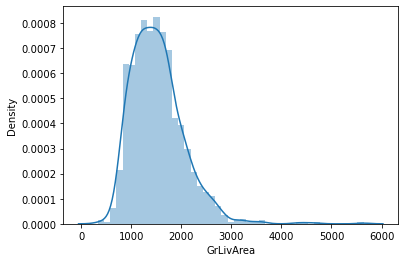

In [62]:
sns.distplot(df1['GrLivArea'])

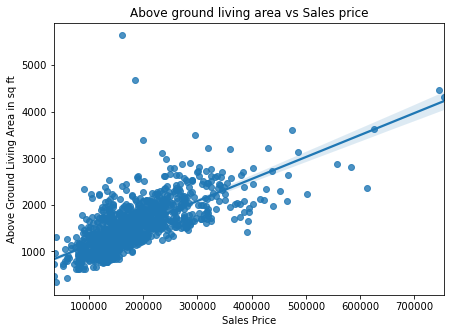

In [65]:
plt.figure(figsize=(7,5))
sns.regplot(df1['SalePrice'],df1['GrLivArea'])
plt.xlabel('Sales Price')
plt.ylabel('Above Ground Living Area in sq ft')
plt.title('Above ground living area vs Sales price')
plt.show()

Observations:
    
    1.The above ground living area and sales price variables vary linearly with each other.

**3.GarageCars vs Sales Price**

In [67]:
df1['GarageCars'].value_counts()

2    665
1    288
3    147
0     64
4      4
Name: GarageCars, dtype: int64

<Figure size 432x288 with 0 Axes>

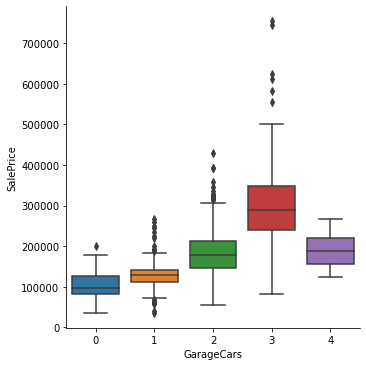

In [77]:
plt.figure()
sns.catplot(x="GarageCars", y="SalePrice",
            kind="box", dodge=False, data=df1)
plt.show()

In [29]:
fig = px.box(df1, x="GarageCars", y="SalePrice")
fig.show()

Observations:
    
    1.The boxplot for garage which consist of 4 cars shows that its median is comparitively less compared to 4 numbers of  
    cars it can be neglated because it has got only 4 entries.

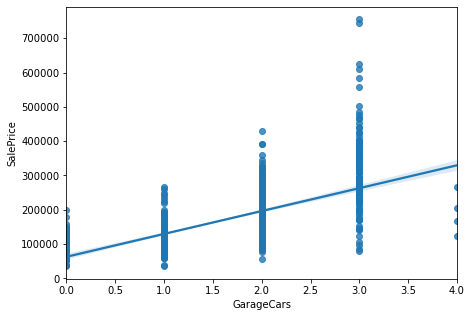

In [79]:
plt.figure(figsize=(7,5))
sns.regplot(df1['GarageCars'],df1['SalePrice'])
plt.show()

Observations:
    
    1.The number of cars that a garage can hold varies linearly with sales price.

**4.GarageArea vs Sales Price**

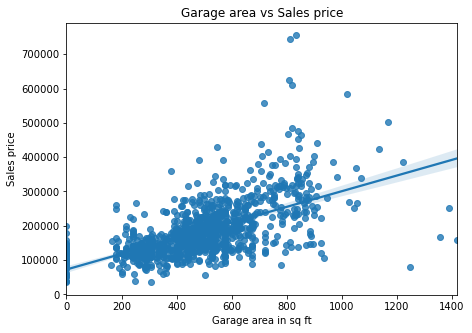

In [83]:
plt.figure(figsize=(7,5))
sns.regplot(df1['GarageArea'],df1['SalePrice'])
plt.xlabel('Garage area in sq ft')
plt.ylabel('Sales price')
plt.title('Garage area vs Sales price')
plt.show()

Observations:
    
    1.The garage area and sales prices are linealy related.

**5.Total square feet of basement area vs Sales Price**

In [85]:
chart=alt.Chart(df1).mark_line().encode(
x='TotalBsmtSF',
y='SalePrice')
chart

alt.Chart(...)

Observations:
    
    1.Generally as basement area increases the sales price also going to be incresed.

**6.1st Floor surface area vs Sales Price**

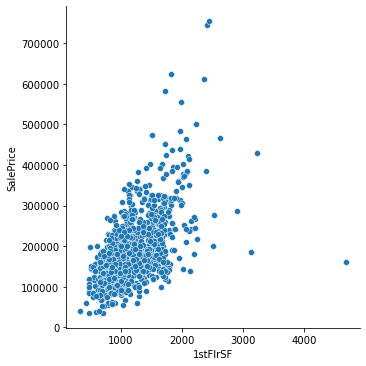

In [89]:
sns.relplot(df1['1stFlrSF'],df1['SalePrice'])

In [90]:
chart=alt.Chart(df1).mark_line().encode(
x='1stFlrSF',
y='SalePrice')
chart

alt.Chart(...)

Observations:
    
    1.There is a positive linear correlation between the 1st floor surface area and sales price.

**7.Full bathrooms above ground vs Sales Price**

In [92]:
df['FullBath'].value_counts()

2    610
1    524
3     27
0      7
Name: FullBath, dtype: int64

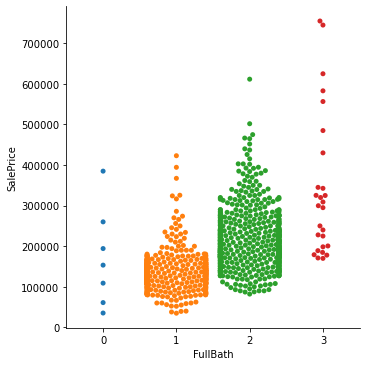

In [96]:
sns.catplot(x='FullBath',y='SalePrice',kind="swarm",data=df1)

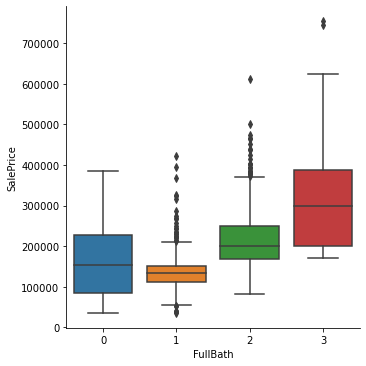

In [97]:
sns.catplot(x='FullBath',y='SalePrice',kind="box",data=df1)

Observations:
    
    1.Generally as number of full bathroom increases the sales price also going to be increased.

**8.Total rooms above ground vs Sales Price**

<Figure size 1440x1152 with 0 Axes>

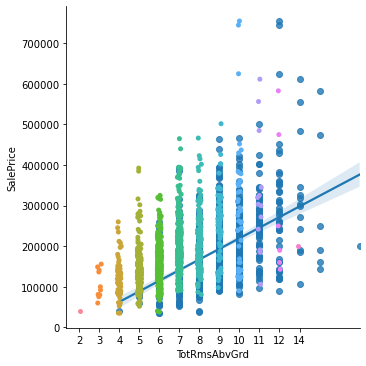

In [105]:
fig=plt.figure(figsize=(20,16))
ax1=sns.catplot(x="TotRmsAbvGrd",y="SalePrice",data=df1)
ax2=sns.regplot(x="TotRmsAbvGrd",y="SalePrice",data=df1)
plt.show()

Observations:
    
    1.As total rooms above the ground increses sales prices also going to increase.

**9.Original Construction date vs Sales Price**

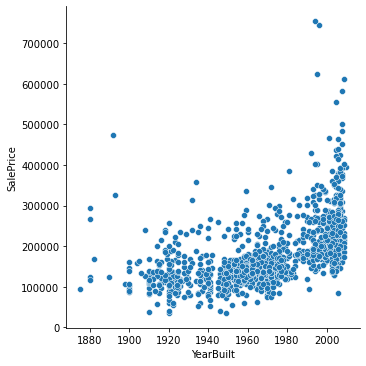

In [107]:
sns.relplot(df1['YearBuilt'],df1['SalePrice'])

<AxesSubplot:xlabel='YearBuilt', ylabel='SalePrice'>

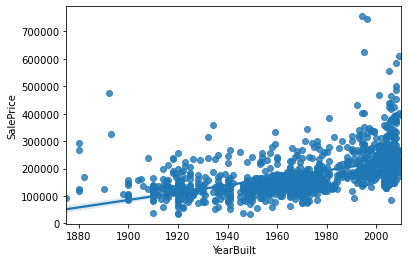

In [109]:
sns.regplot(df1['YearBuilt'],df1['SalePrice'])

Observations:
    
    1.The trend shows that the older the house the lesser the price

In [4]:
df1=pd.read_csv('Housing_Label_Encoded.csv')
df1.head()

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,11,3,NaN,4928,1,2,0,3,4,0,13,2,2,4,2,6,5,1976,1976,1,1,8,9,2,0,3,4,1,2,3,3,0,120,5,0,958,1078,1,4,1,4,958,0,0,958,0,0,2,0,2,1,3,5,6,1,4,1,1977.0,1,2,440,4,4,2,0,205,0,0,0,0,3,4,4,0,2,2007,8,4,128000
1,1,0,3,95.0,15865,1,2,0,3,4,1,12,2,2,0,2,8,6,1970,1970,0,5,12,13,2,0,2,2,2,3,1,1,0,351,4,107,1043,2217,1,0,1,4,2217,0,0,2217,1,0,2,0,4,1,2,8,6,1,4,1,1970.0,2,2,621,4,4,2,81,207,0,0,224,0,3,4,4,0,10,2007,8,4,268000
2,2,5,3,92.0,9920,1,2,0,3,1,0,15,2,2,0,5,7,5,1996,1997,1,1,7,7,2,0,2,4,2,2,3,0,2,862,5,0,255,1117,1,0,1,4,1127,886,0,2013,1,0,2,1,3,1,3,8,6,1,4,1,1997.0,2,2,455,4,4,2,180,130,0,0,0,0,3,4,4,0,6,2007,8,4,269790
3,3,0,3,105.0,11751,1,2,0,3,4,0,14,2,2,0,2,6,6,1977,1977,3,1,8,9,1,236,3,4,1,2,3,3,1,705,5,0,1139,1844,1,0,1,4,1844,0,0,1844,0,0,2,0,3,1,3,7,6,1,4,1,1977.0,1,2,546,4,4,2,0,122,0,0,0,0,3,2,4,0,1,2010,0,4,190000
4,4,0,3,NaN,16635,1,2,0,3,2,0,14,2,2,0,2,6,7,1977,2000,1,1,4,4,3,73,2,4,1,2,3,3,0,1246,5,0,356,1602,1,2,1,4,1602,0,0,1602,0,1,2,0,3,1,2,8,6,1,4,1,1977.0,0,2,529,4,4,2,240,0,0,0,0,0,3,4,4,0,6,2009,8,4,215000


In [5]:
df1.drop('Unnamed: 0',axis=1,inplace=True)

**10.Remodel date (same as construction date if no remodeling or additions) vs Sales Price**

In [19]:
df_No_remodel=df1[df1['YearRemodAdd']==df1['YearBuilt']]

In [20]:
df_No_remodel

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,11,3,NaN,4928,1,2,0,3,4,0,...,0,3,4,4,0,2,2007,8,4,128000
1,0,3,95.0,15865,1,2,0,3,4,1,...,0,3,4,4,0,10,2007,8,4,268000
3,0,3,105.0,11751,1,2,0,3,4,0,...,0,3,2,4,0,1,2010,0,4,190000
5,5,3,58.0,14054,1,2,0,3,4,0,...,0,3,4,4,0,11,2006,6,5,219210
8,0,3,70.0,9170,1,2,3,3,0,0,...,0,3,0,2,400,4,2007,8,4,140000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1159,10,3,42.0,7711,1,2,0,3,4,0,...,0,3,4,4,0,8,2007,7,0,150000
1160,11,3,53.0,4043,1,2,3,3,4,0,...,0,3,4,4,0,10,2008,0,0,140000
1161,5,3,NaN,10762,1,2,0,3,1,0,...,0,3,4,4,0,5,2009,8,4,225000
1163,0,3,NaN,9819,1,2,0,3,4,0,...,0,3,2,4,0,2,2010,8,4,122000


In [21]:
df_remodel=df1[df1['YearRemodAdd']!=df1['YearBuilt']]

In [22]:
df_remodel

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
2,5,3,92.0,9920,1,2,0,3,1,0,...,0,3,4,4,0,6,2007,8,4,269790
4,0,3,NaN,16635,1,2,0,3,2,0,...,0,3,4,4,0,6,2009,8,4,215000
6,0,3,NaN,11341,1,2,0,3,4,0,...,0,3,4,4,0,5,2010,8,4,121500
7,0,3,88.0,13125,1,2,3,3,0,0,...,0,3,0,4,0,1,2006,8,4,155000
9,4,3,80.0,8480,1,2,3,3,4,0,...,0,3,4,4,0,10,2008,0,0,118500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1157,0,4,80.0,8546,1,2,3,3,0,0,...,0,3,4,4,0,3,2010,8,4,140000
1162,1,3,45.0,8212,1,0,3,3,4,0,...,0,3,4,4,0,6,2010,8,4,58500
1164,0,3,67.0,8777,1,2,3,3,4,0,...,0,3,2,4,0,5,2009,8,4,108000
1166,6,0,50.0,8500,1,1,3,3,4,0,...,0,3,2,4,0,7,2008,8,4,40000


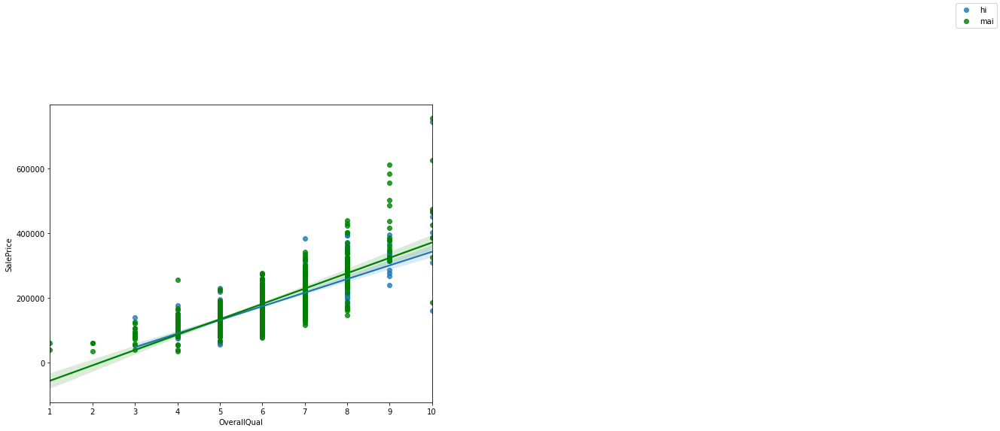

In [52]:
from matplotlib.lines import Line2D
fig=plt.figure(figsize=(20,16))
ax1=fig.add_subplot(221)
ax1=sns.regplot(df_No_remodel['OverallQual'],df_No_remodel['SalePrice'],label="not remodeled")
ax2=fig.add_subplot(221)
ax2=sns.regplot(df_remodel['OverallQual'],df_remodel['SalePrice'],color='g',label="remodeled")
fig.legend(loc=1)
fig.show()

Observations:
    
    1.We can see those homes which have been remodeled will get sold for quite higher price.

**11.Year in which garage was built vs Sales Price**

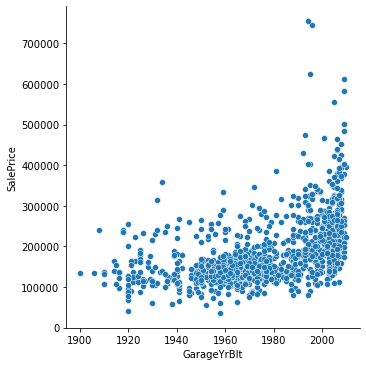

In [58]:
sns.relplot(x='GarageYrBlt',y='SalePrice',data=df1)

<AxesSubplot:xlabel='GarageYrBlt', ylabel='SalePrice'>

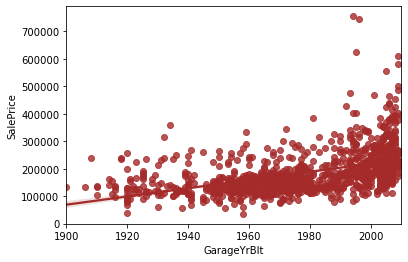

In [60]:
sns.regplot(x='GarageYrBlt',y='SalePrice',data=df1,color='brown')

Observations:
    
    As year of garage built increases the sales price also slighlty increased.

**12.Number of fire places vs Sales Price**

In [61]:
df1['Fireplaces'].value_counts()

0    551
1    518
2     94
3      5
Name: Fireplaces, dtype: int64

Text(0.5, 1.0, 'Number of fireplaces vs sales price')

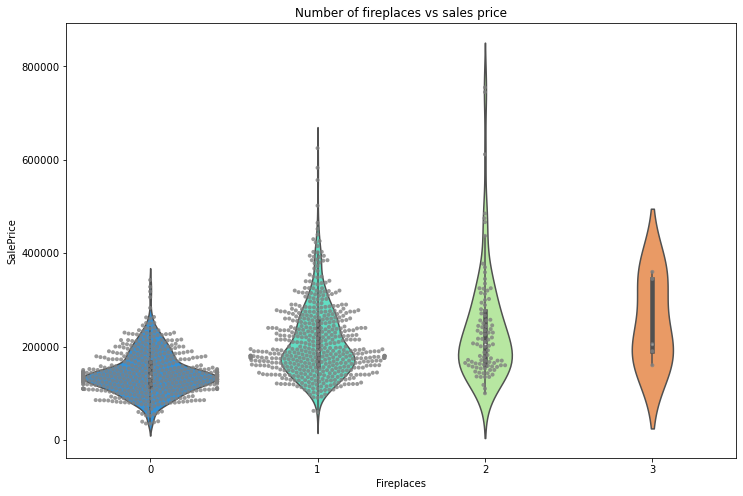

In [63]:
plt.figure(figsize=(12,8))
sns.violinplot(x='Fireplaces',y="SalePrice", data=df1,split='True', palette='rainbow')
sns.swarmplot(x='Fireplaces',y="SalePrice", data=df1, dodge='True', color='grey', alpha=.8, s=4)
plt.title("Number of fireplaces vs sales price")

Observations:
    
    1.We can see a trend here tat if there are more fireplaces then the sale price will be quite highest and entry 3 can be negated because it has only 5 data points.

**13.Masonry veener area in sq ft vs Sales Price**

<AxesSubplot:xlabel='MasVnrArea', ylabel='SalePrice'>

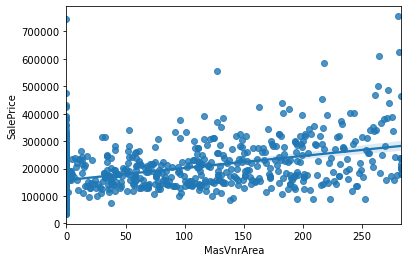

In [65]:
sns.regplot(df1['MasVnrArea'],df1['SalePrice'])

Observations:
    
    As masonry area increases the sales price is going to increase slightly.

**14.Type of foundation vs Sales Price**

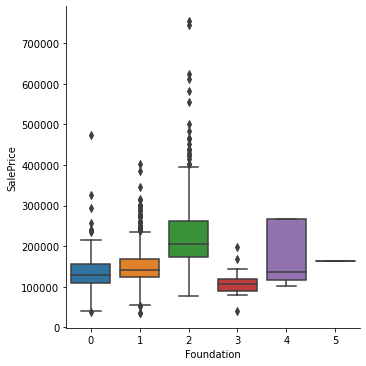

In [66]:
sns.catplot(x="Foundation", y="SalePrice", kind="box", data=df1)

In [67]:
df1['Foundation'].value_counts()

1    516
2    513
0    112
3     21
4      5
5      1
Name: Foundation, dtype: int64

In [68]:
df['Foundation'].value_counts()

CBlock    516
PConc     513
BrkTil    112
Slab       21
Stone       5
Wood        1
Name: Foundation, dtype: int64

Observations:
    
    The sales price varies with the type of foundation,
    1.If its poured concrete foundation then its sales price will be higher than any other type of foundation followed by Cinder block,stone,brick and tail and wood.

**15.basement Type 1 finished square feet vs Sales Price**

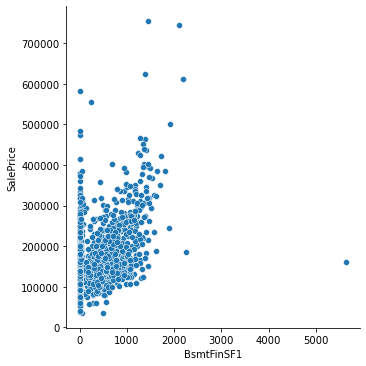

In [6]:
sns.relplot(df1['BsmtFinSF1'],df1['SalePrice'])

<AxesSubplot:xlabel='BsmtFinSF1', ylabel='SalePrice'>

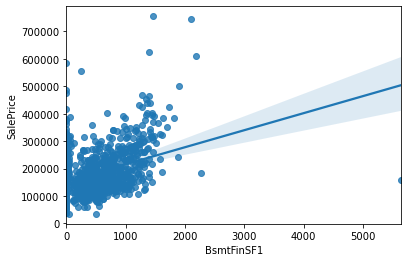

In [7]:
sns.regplot(df1['BsmtFinSF1'],df1['SalePrice'])

Observations:
    
    1.If there is increase in type 1 basement area then there will be increase in the Sales price.

**16.Linear feet of street connected to property vs Sales Price**

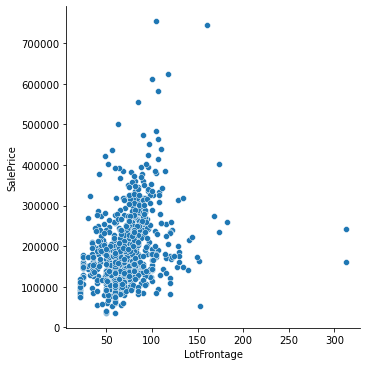

In [8]:
sns.relplot(df1['LotFrontage'],df1['SalePrice'])

<AxesSubplot:xlabel='LotFrontage', ylabel='SalePrice'>

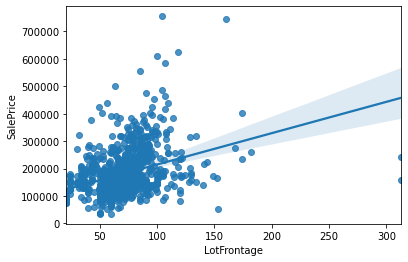

In [9]:
sns.regplot(df1['LotFrontage'],df1['SalePrice'])

**17.Open porch area in square feet vs Sales Price**

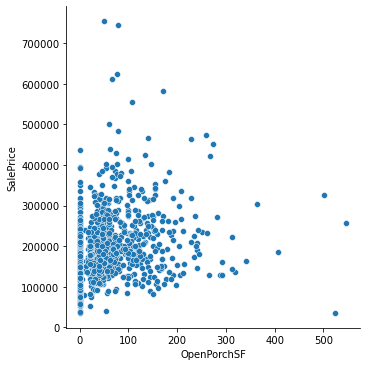

In [12]:
sns.relplot(df1['OpenPorchSF'],df1['SalePrice'])

Observations:
    
    1.If the area of the open porch is between 50 to 200 then it has got maxixum probability of getting sold for higher price.

**18.Second floor square feet vs Sales Price**

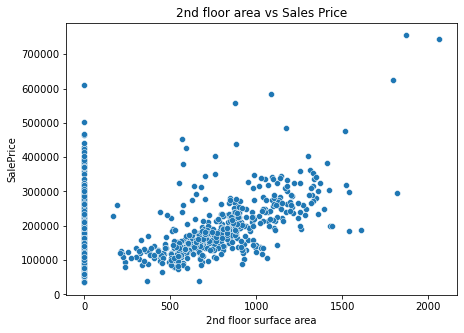

In [16]:
plt.figure(figsize=(7,5))
sns.scatterplot(df1['2ndFlrSF'],df1['SalePrice'])
plt.title('2nd floor area vs Sales Price')
plt.xlabel('2nd floor surface area')
plt.show()

Observations:
    
    1.The grapgh clearly indicates that as 2nd floor surface area increases the sales price also going to increase.

**19.Wood deck area in square feet vs Sales Price**

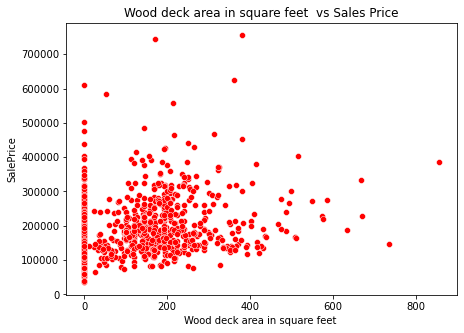

In [19]:
plt.figure(figsize=(7,5))
sns.scatterplot(df1['WoodDeckSF'],df1['SalePrice'],color='r')
plt.title('Wood deck area in square feet  vs Sales Price')
plt.xlabel('Wood deck area in square feet ')
plt.show()

Observations:
    
    1.If the area of the wood deck is between 150 to 400 then it has got significant probabibility to get sold for quite 
    high price

**20.No.of Basement half bathrooms vs Sales Price**

In [20]:
df1['HalfBath'].value_counts()

0    724
1    434
2     10
Name: HalfBath, dtype: int64

Text(0.5, 1.0, 'No.of Basement half bathrooms vs Sales Price')

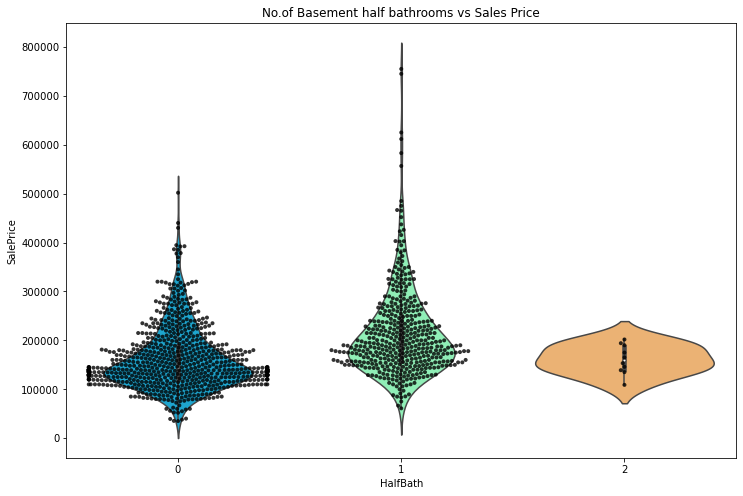

In [25]:
plt.figure(figsize=(12,8))
sns.violinplot(x='HalfBath',y="SalePrice", data=df1,split='True', palette='rainbow')
sns.swarmplot(x='HalfBath',y="SalePrice", data=df1, dodge='True', color='black', alpha=.8, s=4)
plt.title("No.of Basement half bathrooms vs Sales Price")

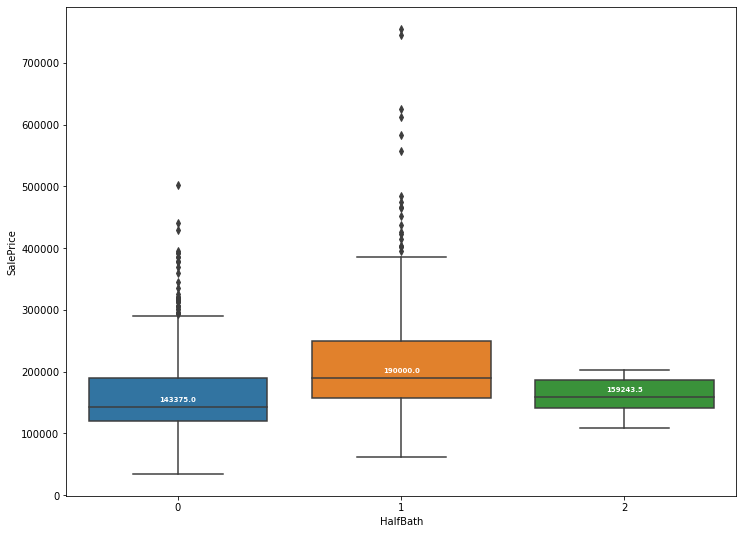

In [31]:
plt.figure(figsize=(12,9))
box_plot = sns.boxplot(x='HalfBath',y='SalePrice',data=df1)

medians = df1.groupby(['HalfBath'])['SalePrice'].median()
vertical_offset = df1['SalePrice'].median() * 0.05 # offset from median for display

for xtick in box_plot.get_xticks():
    box_plot.text(xtick,medians[xtick] + vertical_offset,medians[xtick], 
            horizontalalignment='center',size='x-small',color='w',weight='semibold')
plt.show()

Observations:
    
    1.As the number of half bathroom increases the sales price is also going to increase.

**21.Lot size in square feet vs Sale Price**

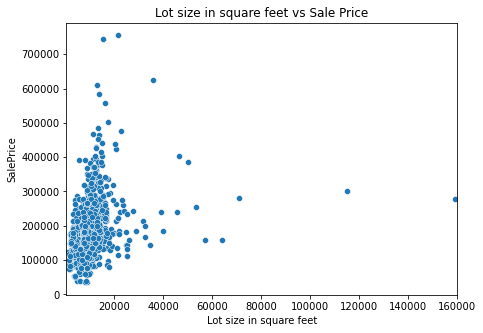

In [33]:
plt.figure(figsize=(7,5))
sns.scatterplot(df1['LotArea'],df1['SalePrice'])
plt.xlim(500,160000)
plt.title('Lot size in square feet vs Sale Price')
plt.xlabel('Lot size in square feet')
plt.show()

Observations:
    
    1.If the lot size is between 1000 to 4000 sqft then it has maximum chance of getting sold for higher price.

**22.Presence of Central air conditioning vs Sale Price**

<AxesSubplot:xlabel='CentralAir', ylabel='SalePrice'>

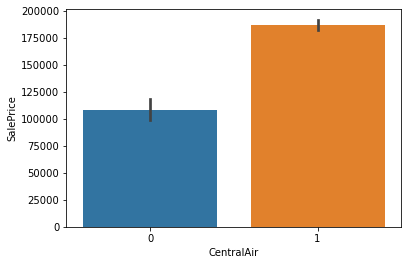

In [34]:
sns.(df1['CentralAir'],df1['SalePrice'])

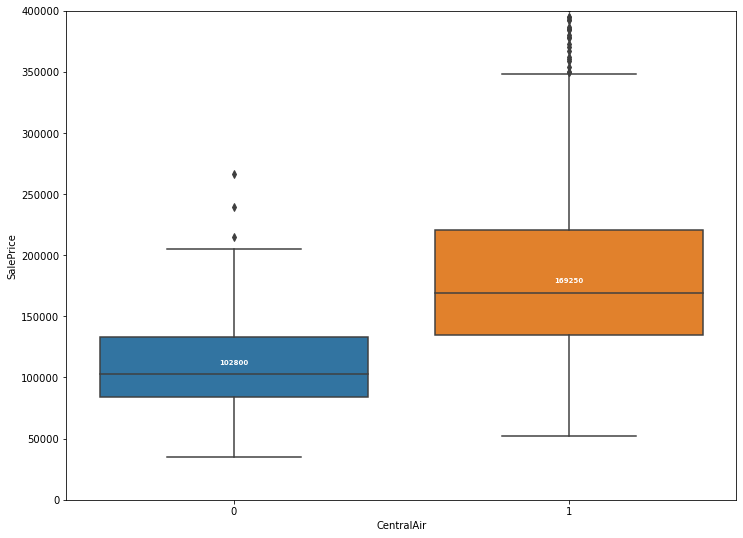

In [42]:
plt.figure(figsize=(12,9))
box_plot = sns.boxplot(x='CentralAir',y='SalePrice',data=df1)

medians = df1.groupby(['CentralAir'])['SalePrice'].median()
vertical_offset = df1['SalePrice'].median() * 0.05 # offset from median for display
plt.ylim(0,400000)

for xtick in box_plot.get_xticks():
    box_plot.text(xtick,medians[xtick] + vertical_offset,medians[xtick], 
            horizontalalignment='center',size='x-small',color='w',weight='semibold')
plt.show()

Observations:
    
    1.The presence of air conditioner will increse the sales price by 65% in general.

**23.Evaluates the height of the basement vs Sale Price**



    Excellent (100+ inches)
    Gd-Good (90-99 inches)
    TA-Typical (80-89 inches)
    Fa-Fair (70-79 inches)
    Po-Poor (<70 inches
    NA-No Basement

In [63]:
df1['BsmtQual']=df['BsmtQual']

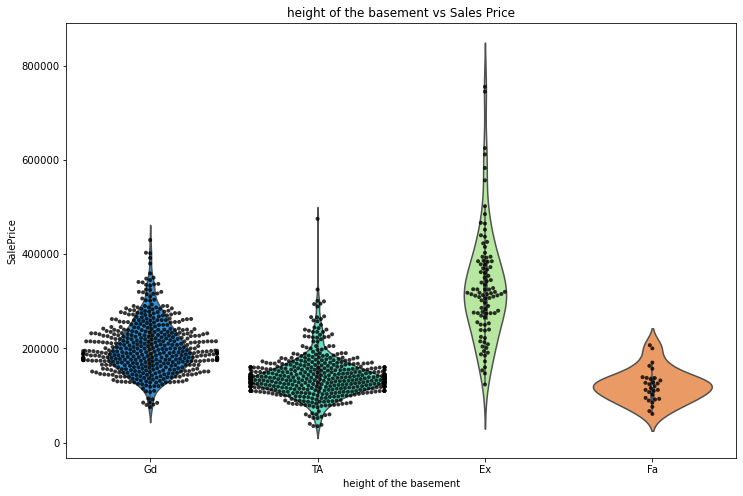

In [66]:
plt.figure(figsize=(12,8))
sns.violinplot(x='BsmtQual',y="SalePrice", data=df1,split='True', palette='rainbow')
sns.swarmplot(x='BsmtQual',y="SalePrice", data=df1, dodge='True', color='black', alpha=.8, s=4)
plt.xlabel('height of the basement')
plt.title("height of the basement vs Sales Price")
plt.show()

Observations:
    
    1.The Excellent (100+ inches) basement will get sold for significantly high  price followed by Gd-Good (90-99 inches),TA-Typical (80-89 inches)

**24.Evaluates the quality of the material on the exterior  vs Sale Price**


       Ex-Excellent
       Gd-Good
       TA-Average/Typical
       Fa-Fair
       Po-Poor

In [67]:
df['ExterQual'].value_counts()

TA    717
Gd    397
Ex     43
Fa     11
Name: ExterQual, dtype: int64

In [68]:
df1['ExterQual'].value_counts()

3    717
2    397
0     43
1     11
Name: ExterQual, dtype: int64

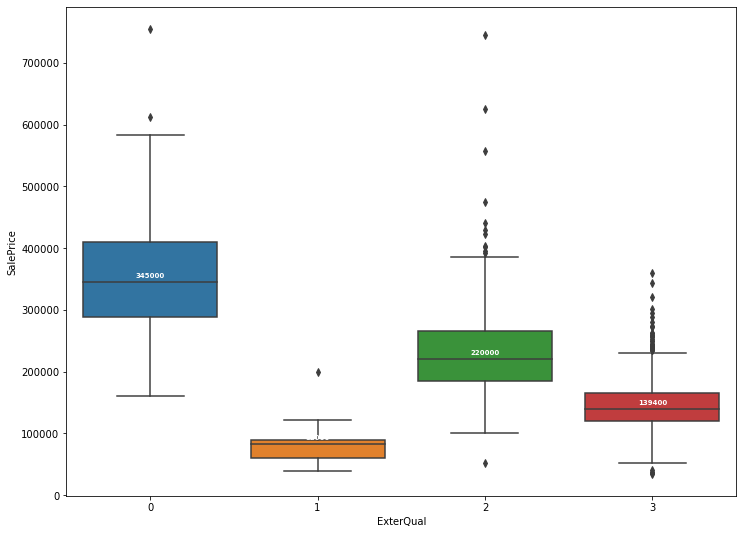

In [69]:
plt.figure(figsize=(12,9))
box_plot = sns.boxplot(x='ExterQual',y='SalePrice',data=df1)

medians = df1.groupby(['ExterQual'])['SalePrice'].median()
vertical_offset = df1['SalePrice'].median() * 0.05 # offset from median for display
#plt.ylim(0,400000)

for xtick in box_plot.get_xticks():
    box_plot.text(xtick,medians[xtick] + vertical_offset,medians[xtick], 
            horizontalalignment='center',size='x-small',color='w',weight='semibold')
plt.show()

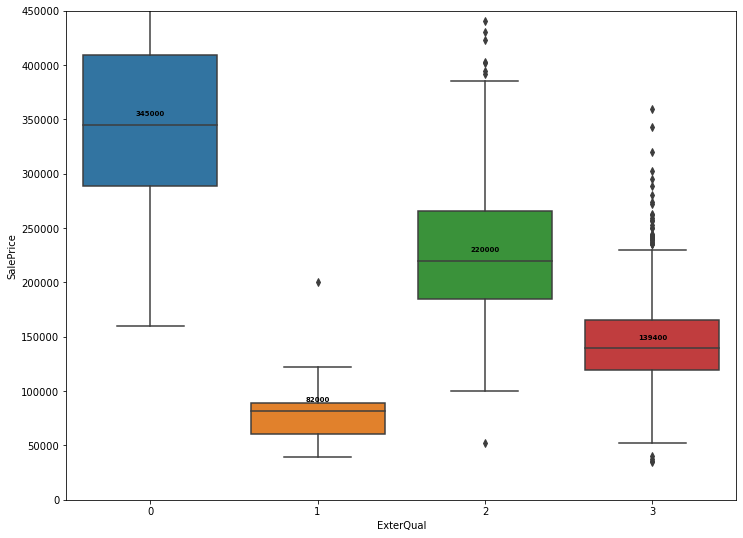

In [72]:
plt.figure(figsize=(12,9))
box_plot = sns.boxplot(x='ExterQual',y='SalePrice',data=df1)

medians = df1.groupby(['ExterQual'])['SalePrice'].median()
vertical_offset = df1['SalePrice'].median() * 0.05 # offset from median for display
plt.ylim(0,450000)

for xtick in box_plot.get_xticks():
    box_plot.text(xtick,medians[xtick] + vertical_offset,medians[xtick], 
            horizontalalignment='center',size='x-small',color='black',weight='semibold')
plt.show()

Observations:
    
    Quality of material on the external wall has got a significant affect on sales price,
    1.The excellent external material will get sold for higher price,followed by good,average/typical, and fair.

**25.Kitchen quality vs Sale Price**

       Ex-Excellent
       Gd-Good
       TA-Typical/Average
       Fa-Fair
       Po-Poor

In [73]:
df1['KitchenQual'].value_counts()

3    578
2    478
0     82
1     30
Name: KitchenQual, dtype: int64

In [74]:
df['KitchenQual'].value_counts()

TA    578
Gd    478
Ex     82
Fa     30
Name: KitchenQual, dtype: int64

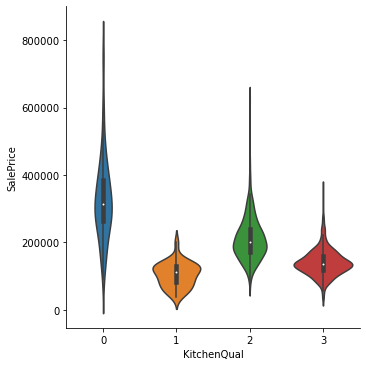

In [83]:
sns.catplot(x="KitchenQual", y="SalePrice",
            kind="violin",data=df1)

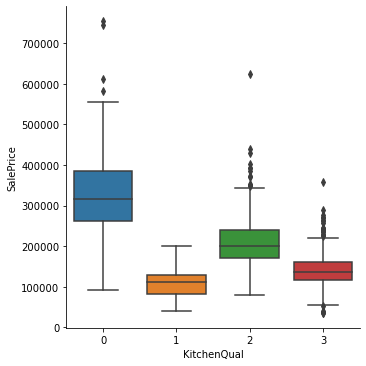

In [81]:
sns.catplot(x="KitchenQual", y="SalePrice",
            kind="box", data=df1)

Observations:
    
    1.The excellent kitchen quality will get sold for higher price,followed by good,average/typical, and fair.

**26.Interior finish of the garage vs Sales price**

In [95]:
df['GarageFinish'].value_counts()

Unf    487
RFn    339
Fin    278
Name: GarageFinish, dtype: int64

In [92]:
df1['GarageFinish']=df['GarageFinish']

       Fin-Finished
       RFn-Rough Finished
       Unf-Unfinished
       NA-No Garage

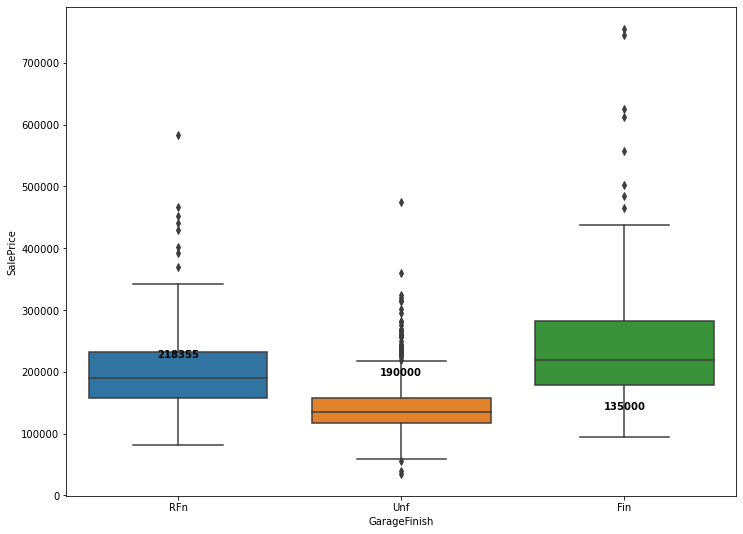

In [102]:
plt.figure(figsize=(12,9))
box_plot = sns.boxplot(x='GarageFinish',y='SalePrice',data=df1)

medians = df1.groupby(['GarageFinish'])['SalePrice'].median()
vertical_offset = df1['SalePrice'].median()*0.03# offset from median for display
#plt.ylim(0,450000)

for xtick in box_plot.get_xticks():
    box_plot.text(xtick,medians[xtick] + vertical_offset,medians[xtick], 
            horizontalalignment='center',color='black',weight='semibold')
plt.show()

Observations:
    
    1.If garage is finished then it will have higher sales price followed by rough finish and unfinish.

**27.Fireplace quality vs Sales price**

In [103]:
df['FireplaceQu'].value_counts()

Gd    301
TA    252
Fa     25
Ex     21
Po     18
Name: FireplaceQu, dtype: int64

In [106]:
df1['FireplaceQu']=df['FireplaceQu']

In [ ]:
plt.figure(figsize=(12,8))
sns.violinplot(x='FireplaceQu',y="SalePrice", data=df1,split='True', palette='rainbow')
sns.swarmplot(x='FireplaceQu',y="SalePrice", data=df1, dodge='True', color='black', alpha=.8, s=4)
plt.xlabel('Fireplace quality ')
plt.title("Fireplace quality  vs Sales Price")
plt.show()

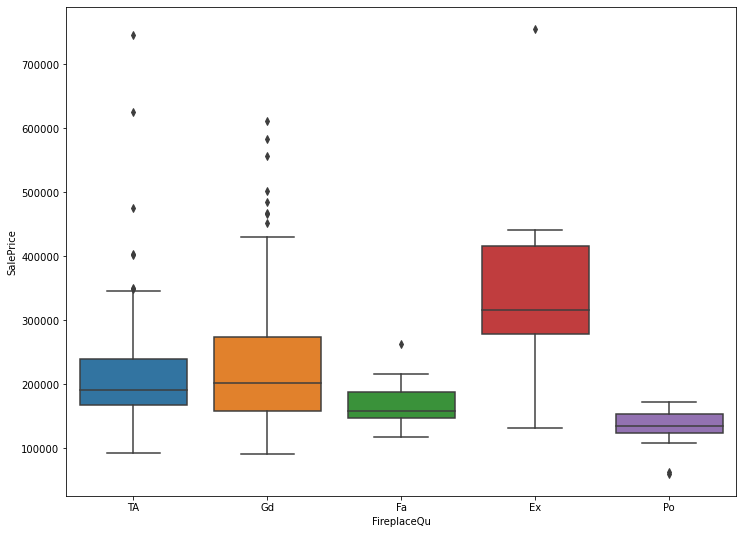

In [110]:
plt.figure(figsize=(12,9))
box_plot = sns.boxplot(x='FireplaceQu',y='SalePrice',data=df1)
plt.show()

Observations:
    
    1.The excellent kitchen quality will get sold for higher price,followed by good,average/typical,fair and poor.

**28.Garage location vs Sales price**


       2Types-  More than one type of garage
       Attchd-  Attached to home
       Basment- Basement Garage
       BuiltIn- Built-In (Garage part of house - typically has room above garage)
       CarPort- Car Port
       Detchd-  Detached from home
       NA-      No Garage

In [111]:
df['GarageType'].value_counts()

Attchd     691
Detchd     314
BuiltIn     70
Basment     16
CarPort      8
2Types       5
Name: GarageType, dtype: int64

In [113]:
df1['GarageType']=df['GarageType']

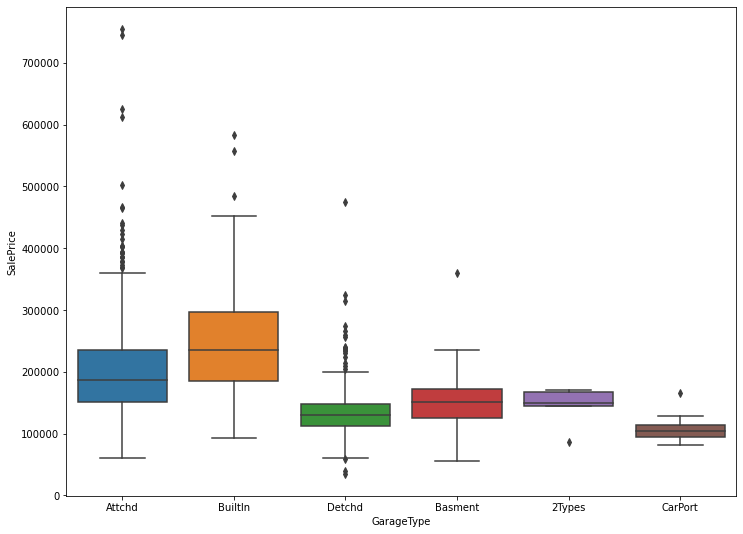

In [114]:
plt.figure(figsize=(12,9))
sns.boxplot(x='GarageType',y='SalePrice',data=df1)
plt.show()

Observations:
    
    1.The sales price of Built-In (Garage part of house - typically has room above garage) is higher compared to all 
    followed by attached home garage,basement garage,more than one type of garage,detached garage from home, and car port

# Data cleaning

In [115]:
df.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       214
LotArea             0
Street              0
Alley            1091
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          7
MasVnrArea          7
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           30
BsmtCond           30
BsmtExposure       31
BsmtFinType1       30
BsmtFinSF1          0
BsmtFinType2       31
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [ ]:
LotFrontage       214
Alley            1091
MasVnrType          7
MasVnrArea          7
BsmtQual           30
BsmtCond           30
BsmtExposure       31
BsmtFinType1       30
BsmtFinType2       31
FireplaceQu       551
GarageType         64
GarageYrBlt        64
GarageFinish       64
GarageQual         64
GarageCond         64
PoolQC           1161
Fence             931
MiscFeature      1124

In [118]:
df1['LotFrontage'].isnull().sum()

214

<AxesSubplot:xlabel='LotFrontage', ylabel='Density'>

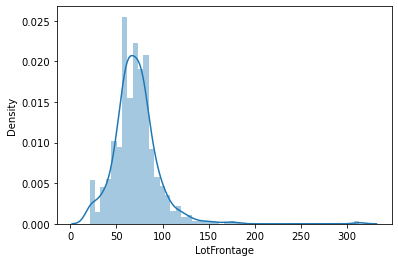

In [119]:
sns.distplot(df1['LotFrontage'])

In [121]:
print(df1['LotFrontage'].mean())
print(df1['LotFrontage'].median())

70.98846960167715
70.0


In [122]:
df1['LotFrontage'].fillna(70,inplace=True)

In [123]:
df1['LotFrontage'].isnull().sum()

0

In [125]:
df1.drop('Alley',axis=1,inplace=True)

In [128]:
df['MasVnrType'].value_counts()

None       696
BrkFace    354
Stone       98
BrkCmn      13
Name: MasVnrType, dtype: int64

In [129]:
df1['MasVnrType'].value_counts()

2    696
1    354
3     98
0     13
4      7
Name: MasVnrType, dtype: int64

In [130]:
df1['MasVnrType'].replace(4,2,inplace=True)

In [131]:
df1['MasVnrType'].value_counts()

2    703
1    354
3     98
0     13
Name: MasVnrType, dtype: int64

In [135]:
df1['MasVnrArea']=df['MasVnrArea']

In [137]:
df1['MasVnrArea'].isnull().sum()

7

In [138]:
df1['MasVnrArea'].fillna(df1['MasVnrArea'].median(),inplace=True)

In [139]:
df1['MasVnrArea'].isnull().sum()

0

In [140]:
df1['BsmtQual'].isnull().sum()

30

In [145]:
df1['BsmtQual'].value_counts()

TA    517
Gd    498
Ex     94
Fa     29
Name: BsmtQual, dtype: int64

In [146]:
df1['BsmtQual'].fillna('TA',inplace=True)

In [150]:
df1['BsmtQual'].isnull().sum()

0

In [148]:
df1['BsmtQual']=le.fit_transform(df1['BsmtQual'])

In [154]:
df1['BsmtCond']=df['BsmtCond']

In [158]:
df1['BsmtCond'].value_counts()

TA    1041
Gd      56
Fa      39
Po       2
Name: BsmtCond, dtype: int64

In [159]:
df1['BsmtCond'].fillna('TA',inplace=True)

In [162]:
df1['BsmtCond']=le.fit_transform(df1['BsmtCond'])

In [165]:
df1['BsmtExposure']=df['BsmtExposure']

In [171]:
df1['BsmtExposure'].value_counts()

No    787
Av    180
Gd    108
Mn     93
Name: BsmtExposure, dtype: int64

In [168]:
df1['BsmtExposure'].fillna('No',inplace=True)

In [169]:
df1['BsmtExposure'].isnull().sum()

0

In [184]:
df1['BsmtExposure']=le.fit_transform(df1['BsmtExposure'])

In [175]:
df1['BsmtFinType1']=df['BsmtFinType1']

In [176]:
df1['BsmtFinType1'].value_counts()

Unf    345
GLQ    330
ALQ    174
BLQ    121
Rec    109
LwQ     59
Name: BsmtFinType1, dtype: int64

In [177]:
df1['BsmtFinType1'].fillna('Unf',inplace=True)

In [180]:
df1['BsmtFinType2']=df['BsmtFinType2']

In [181]:
df1['BsmtFinType2'].value_counts()

Unf    1002
Rec      43
LwQ      40
BLQ      24
ALQ      16
GLQ      12
Name: BsmtFinType2, dtype: int64

In [182]:
df1['BsmtFinType2'].fillna('Unf',inplace=True)

In [186]:
df1['BsmtFinType2'].isnull().sum()

0

In [187]:
df1['BsmtFinType2']=le.fit_transform(df1['BsmtFinType2'])

In [190]:
df1['BsmtFinType1']=le.fit_transform(df1['BsmtFinType1'])

In [193]:
df1['FireplaceQu'].isnull().sum()

551

In [194]:
df1['FireplaceQu'].value_counts()

Gd    301
TA    252
Fa     25
Ex     21
Po     18
Name: FireplaceQu, dtype: int64

In [195]:
df1['FireplaceQu'].fillna('Gd',inplace=True)

In [241]:
df1['FireplaceQu']=le.fit_transform(df1['FireplaceQu'])

In [196]:
df1['GarageType'].isnull().sum()

64

In [198]:
df1['GarageType'].fillna('Attchd',inplace=True)

In [199]:
df1['GarageType']=le.fit_transform(df1['GarageType'])

In [208]:
df1['GarageYrBlt']=df['GarageYrBlt']

In [209]:
df1['GarageYrBlt'].isnull().sum()

64

In [210]:
df1['GarageYrBlt'].fillna(method="bfill",inplace=True)

In [212]:
df1['GarageYrBlt'].isnull().sum()

0

In [215]:
df1['GarageFinish'].fillna('Unf',inplace=True)

In [216]:
df1['GarageFinish'].isnull().sum()

0

In [218]:
df1['GarageFinish']=le.fit_transform(df1['GarageFinish'])

In [224]:
df1['GarageQual']=df['GarageQual']

In [227]:
df1['GarageQual'].fillna('TA',inplace=True)

In [229]:
df1['GarageQual']=le.fit_transform(df1['GarageQual'])

In [234]:
df1['GarageCond']=df['GarageCond']

In [236]:
df1['GarageCond'].fillna('TA',inplace=True)

In [238]:
df1['GarageCond']=le.fit_transform(df1['GarageCond'])

In [243]:
df1.drop(['PoolQC','MiscFeature'],axis=1,inplace=True)

In [245]:
df1.drop('Fence',axis=1,inplace=True)

In [247]:
df1.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd     0
Functional  

In [248]:
df1.to_csv('cleaned_df1.csv')

# Removing the outliers

**Zscore method**

In [250]:
from scipy.stats import zscore

In [251]:
z=np.abs(zscore(df1))
threshold=3
df2=df1[(z<3).all(axis=1)]
print('percentage of loss of data by zscore is :',(df1.shape[0]-df2.shape[0])/df1.shape[0])

percentage of loss of data by zscore is : 0.589041095890411


Observations:
    
    1.We cant use this because the data loss is more than 7%

**IQR Method**

In [257]:
q1=df1.quantile(0)
q3=df1.quantile(0.98)
IQR=q3-q1
df2=df1[~((df1 <(q1-1.5*IQR))|(df1 >(q3+1.5*IQR))).any(axis=1)]
print('percentage of loss of data by IQR is :',(df1.shape[0]-df2.shape[0])/df1.shape[0])

percentage of loss of data by IQR is : 0.07448630136986302


Observations:
    
    1.Since data loss is around 7%, we can continue with this

In [258]:
df2.shape

(1081, 75)

# Splitting the target variable

In [266]:
x1=df1.drop('SalePrice',axis=1)
y1=df1['SalePrice']

In [267]:
x2=df2.drop('SalePrice',axis=1)
y2=df2['SalePrice']

In [269]:
x1.shape

(1168, 74)

In [268]:
x2.shape

(1081, 74)

# Removal of skewness

In [270]:
x2.skew()

MSSubClass        0.672976
MSZoning         -1.776208
LotFrontage       0.752748
LotArea           3.131061
Street          -18.929613
LotShape         -0.631669
LandContour      -3.301510
LotConfig        -1.177546
LandSlope         5.122639
Neighborhood      0.028834
Condition1        3.033924
Condition2       -0.967155
BldgType          2.309225
HouseStyle        0.269517
OverallQual       0.145080
OverallCond       0.607318
YearBuilt        -0.608500
YearRemodAdd     -0.497973
RoofStyle         1.528438
RoofMatl         32.878564
Exterior1st      -0.622701
Exterior2nd      -0.603759
MasVnrType       -0.059036
MasVnrArea        2.849810
ExterQual        -1.817854
ExterCond        -2.608801
Foundation       -0.064983
BsmtQual         -1.330996
BsmtCond         -3.337168
BsmtExposure     -1.200536
BsmtFinType1     -0.078837
BsmtFinSF1        0.789101
BsmtFinType2     -3.652472
BsmtFinSF2        3.611471
BsmtUnfSF         0.924606
TotalBsmtSF       0.635465
Heating           8.857999
H

In [272]:
from sklearn.preprocessing import PowerTransformer
power = PowerTransformer(method='yeo-johnson', standardize=True)
x_power = power.fit_transform(x2)

In [276]:
from sklearn.preprocessing import StandardScaler
st=StandardScaler()

In [277]:
x_scale=st.fit_transform(x2)

In [278]:
#finding the best accuracy using x1,y1 models
maxAccu=0
ln=LinearRegression()
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=0.3,random_state=i)
    mod=ln
    mod.fit(x_train,y_train)
    pred=mod.predict(x_test)
    acc=r2_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print('the best accuracy is ',maxAccu,'on random state',maxRS)

the best accuracy is  0.8746558925775996 on random state 135


In [279]:
#finding the best accuracy using x2,y2 models
maxAccu=0
ln=LinearRegression()
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x2,y2,test_size=0.3,random_state=i)
    mod=ln
    mod.fit(x_train,y_train)
    pred=mod.predict(x_test)
    acc=r2_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print('the best accuracy is ',maxAccu,'on random state',maxRS)

the best accuracy is  0.8956831563119241 on random state 14


In [280]:
#finding the best accuracy using x_power,y2 models
maxAccu=0
ln=LinearRegression()
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x_power,y2,test_size=0.3,random_state=i)
    mod=ln
    mod.fit(x_train,y_train)
    pred=mod.predict(x_test)
    acc=r2_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print('the best accuracy is ',maxAccu,'on random state',maxRS)

the best accuracy is  0.8725810328684327 on random state 168


In [281]:
#finding the best accuracy using x_scale,y2 models
maxAccu=0
ln=LinearRegression()
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x_scale,y2,test_size=0.3,random_state=i)
    mod=ln
    mod.fit(x_train,y_train)
    pred=mod.predict(x_test)
    acc=r2_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print('the best accuracy is ',maxAccu,'on random state',maxRS)

the best accuracy is  0.8918191674382044 on random state 87


Observations:
    
    1.The best model is x2,y2 for the random state 14

In [282]:
x_train,x_test,y_train,y_test=train_test_split(x2,y2,test_size=0.3,random_state=14)

In [283]:
print('x train shape:',x_train.shape)
print('x test shape',x_test.shape)
print('\n')
print('y train shape:',y_train.shape)
print('y test shape',y_test.shape)

x train shape: (756, 74)
x test shape (325, 74)


y train shape: (756,)
y test shape (325,)


In [284]:
#linear model
ln=LinearRegression()
ln.fit(x_train,y_train)
predln=ln.predict(x_test)
print('r2 score is :',round((r2_score(y_test,predln)),3))
print('RMSE:',round(np.sqrt(mean_squared_error(y_test,predln)),3))
print('mean absolute error:',round((mean_absolute_error(y_test,predln)),3))

r2 score is : 0.896
RMSE: 23402.494
mean absolute error: 17891.43


In [291]:
#lasso model
ls=Lasso(alpha=2.5)
ls.fit(x_train,y_train)
predls=ls.predict(x_test)
print('r2 score is :',round((r2_score(y_test,predls)),3))
print('RMSE:',round(np.sqrt(mean_squared_error(y_test,predls)),3))
print('mean absolute error:',round((mean_absolute_error(y_test,predls)),3))

r2 score is : 0.896
RMSE: 23386.629
mean absolute error: 17881.855


In [297]:
#Ridge model
rd=Ridge(alpha=2.5)
rd.fit(x_train,y_train)
predrd=rd.predict(x_test)
print('r2 score is :',round((r2_score(y_test,predrd)),3))
print('RMSE:',round(np.sqrt(mean_squared_error(y_test,predrd)),3))
print('mean absolute error:',round((mean_absolute_error(y_test,predrd)),3))

r2 score is : 0.897
RMSE: 23219.907
mean absolute error: 17763.64


In [301]:
#ElasticNet model
enr=ElasticNet(alpha=0.1)
enr.fit(x_train,y_train)
predenr=enr.predict(x_test)
print('r2 score is :',round((r2_score(y_test,predenr)),3))
print('RMSE:',round(np.sqrt(mean_squared_error(y_test,predenr)),3))
print('mean absolute error:',round((mean_absolute_error(y_test,predenr)),3))

r2 score is : 0.898
RMSE: 23192.433
mean absolute error: 17479.941


In [302]:
ran = RANSACRegressor(base_estimator=LinearRegression(), max_trials=100)
ran.fit(x_train, y_train)
predran=ran.predict(x_test)
print('r2 score is :',round((r2_score(y_test,predran)),3))
print('RMSE:',round(np.sqrt(mean_squared_error(y_test,predran)),3))
print('mean absolute error:',round((mean_absolute_error(y_test,predran)),3))

r2 score is : 0.362
RMSE: 57889.26
mean absolute error: 31495.336


In [303]:
rf = RandomForestRegressor(n_estimators=100)
rf.fit(x_train, y_train)
predrf=rf.predict(x_test)
print('r2 score is :',round((r2_score(y_test,predrf)),3))
print('RMSE:',round(np.sqrt(mean_squared_error(y_test,predrf)),3))
print('mean absolute error:',round((mean_absolute_error(y_test,predrf)),3))

r2 score is : 0.899
RMSE: 22985.224
mean absolute error: 16174.083


# Cross validation score

In [305]:
models=[ln,ls,rd,enr,ran,rf]
for m in models:
    
    score=cross_val_score(m,x2,y2,cv=5)
    print(m,'score is:')
    print(round((score.mean()),3))
    print('\n')

LinearRegression() score is:
0.833


Lasso(alpha=2.5) score is:
0.834


Ridge(alpha=2.5) score is:
0.838


ElasticNet(alpha=0.1) score is:
0.845


RANSACRegressor(base_estimator=LinearRegression()) score is:
0.578


RandomForestRegressor() score is:
0.854




Observations:
    
    The difference between r2 score and cross val value of models are as below:
    1.LinearRegression:0.063
    2.Lasso           :0.056
    3.Ridge           :0.059
    4.ElasticNet      :0.053
    5.RANSACRegressor :-0.216
    6.RF              :0.045

        So the best model is Random Forest Regressor since it has got the least difference among all.

# Hyper parameter tuning

In [306]:
rf=RandomForestRegressor()
grid_param={
    'criterion':['mse','mae'],
    
    'max_depth':[10,20,30,40,50],
    'max_features':['auto', 'sqrt', 'log2'],
    'min_samples_split':[2,5,10,15,20],
    'bootstrap':[True,False]
}

gd_sr=GridSearchCV(estimator=rf,
                  param_grid=grid_param,
                  scoring='r2',
                  cv=5)

gd_sr.fit(x2,y2)

best_parameters=gd_sr.best_params_
print(best_parameters)
best_result=gd_sr.best_score_
print(best_result)

{'bootstrap': False, 'criterion': 'mse', 'max_depth': 50, 'max_features': 'sqrt', 'min_samples_split': 2}
0.8643391899273511


In [307]:
rf1=RandomForestRegressor(n_estimators=100,criterion='mse',max_depth=50,max_features='sqrt',min_samples_split=2,bootstrap=False)

In [308]:
rf1.fit(x_train, y_train)
predrf1=rf1.predict(x_test)
print('r2 score is :',round((r2_score(y_test,predrf1)),3))
print('RMSE:',round(np.sqrt(mean_squared_error(y_test,predrf1)),3))
print('mean absolute error:',round((mean_absolute_error(y_test,predrf1)),3))

r2 score is : 0.904
RMSE: 22402.767
mean absolute error: 15590.564


# Importing the predicting dataset

In [309]:
df_t=pd.read_csv('House_test.csv')
df_test=pd.DataFrame()
for i in x1.columns:
    df_test[i]=df_t[i]

In [310]:
df_test.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,20,RL,86.0,14157,Pave,IR1,HLS,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,0,7,2007,WD,Normal
1,120,RL,NaN,5814,Pave,IR1,Lvl,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,0,8,2009,COD,Abnorml
2,20,RL,NaN,11838,Pave,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,0,6,2009,WD,Normal
3,70,RL,75.0,12000,Pave,Reg,Bnk,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,0,7,2009,WD,Normal
4,60,RL,86.0,14598,Pave,IR1,Lvl,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,0,1,2008,WD,Normal


In [311]:
df_test.shape

(292, 74)

In [313]:
x2.shape

(1081, 74)

In [312]:
df_test.isnull().sum()

MSSubClass         0
MSZoning           0
LotFrontage       45
LotArea            0
Street             0
LotShape           0
LandContour        0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         1
MasVnrArea         1
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           7
BsmtCond           7
BsmtExposure       7
BsmtFinType1       7
BsmtFinSF1         0
BsmtFinType2       7
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath       0
FullBath           0
HalfBath     

<AxesSubplot:xlabel='LotFrontage', ylabel='Density'>

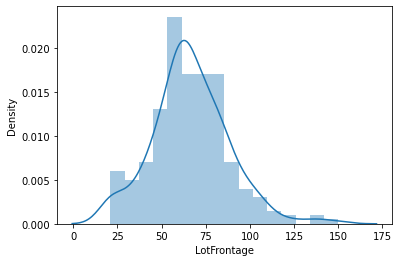

In [315]:
sns.distplot(df_test['LotFrontage'])

In [316]:
df_test['LotFrontage'].fillna(df_test['LotFrontage'].median(),inplace=True)

In [321]:
df_test['MasVnrType'].fillna('None',inplace=True)

In [324]:
df_test['MasVnrArea'].fillna(df_test['MasVnrArea'].median(),inplace=True)

In [327]:
df_test['BsmtQual'].fillna('TA',inplace=True)

In [329]:
df_test['BsmtCond'].fillna('TA',inplace=True)

In [331]:
df_test['BsmtExposure'].fillna('No',inplace=True)

In [333]:
df_test['BsmtFinType1'].fillna('GLQ',inplace=True)

In [335]:
df_test['BsmtFinType2'].fillna('Unf',inplace=True)

In [337]:
df_test['Electrical'].fillna('SBrkr',inplace=True)

In [339]:
df_test['FireplaceQu'].fillna('Gd',inplace=True)

In [341]:
df_test['GarageType'].fillna('Attchd',inplace=True)

In [343]:
df_test['GarageYrBlt'].fillna(2004,inplace=True)

In [345]:
df_test['GarageFinish'].fillna('Unf',inplace=True)

In [347]:
df_test['GarageQual'].fillna('TA',inplace=True)

In [349]:
df_test['GarageCond'].fillna('TA',inplace=True)

In [350]:
df_test.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd     0
Functional  

In [353]:
df_predict=pd.DataFrame()
for i in df_test.columns:
    df_predict[i]=le.fit_transform(df_test[i])

In [354]:
df_predict.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,0,2,47,215,1,0,1,0,0,21,2,0,0,2,6,2,79,52,3,0,9,11,3,45,2,3,2,0,2,1,2,170,5,0,139,217,0,0,1,3,229,0,0,203,1,0,2,0,3,0,2,5,5,1,2,1,65,0,3,129,4,4,2,46,27,0,0,0,0,0,6,1,5,2
1,11,2,29,34,1,0,3,1,0,21,2,0,4,2,5,2,60,31,1,0,5,5,2,0,2,3,1,2,2,0,2,151,5,0,24,139,0,2,1,3,167,0,0,93,1,0,1,0,1,0,2,1,5,1,0,1,45,1,2,104,4,4,2,9,0,0,0,0,0,0,7,3,0,0
2,0,2,29,180,1,3,3,4,0,4,2,0,0,2,5,2,75,47,3,0,9,11,2,0,2,3,2,2,2,0,5,0,5,0,228,209,0,0,1,3,223,0,0,190,0,0,2,0,3,0,0,4,5,1,4,1,61,1,2,89,4,4,2,50,72,0,0,0,0,0,5,3,5,2
3,6,2,39,185,1,3,0,4,0,5,2,0,0,5,4,4,25,0,1,0,6,7,2,0,3,3,1,3,2,3,4,28,5,0,92,31,0,0,1,3,57,41,0,138,0,0,1,1,3,0,1,4,5,1,2,1,12,2,1,6,4,4,2,0,0,0,0,0,0,0,6,3,5,2
4,5,2,47,220,1,0,3,1,0,20,1,0,0,5,3,2,81,53,1,0,9,11,3,11,2,3,2,2,2,2,5,0,5,0,181,76,0,0,1,3,65,93,0,205,0,0,2,1,4,0,2,6,5,1,2,3,67,0,3,126,4,4,2,17,3,0,0,0,0,0,0,2,5,2


In [355]:
predicted_sales_price=rf1.predict(df_predict)

In [357]:
df_test.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,20,RL,86.0,14157,Pave,IR1,HLS,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,0,7,2007,WD,Normal
1,120,RL,65.0,5814,Pave,IR1,Lvl,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,0,8,2009,COD,Abnorml
2,20,RL,65.0,11838,Pave,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,0,6,2009,WD,Normal
3,70,RL,75.0,12000,Pave,Reg,Bnk,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,0,7,2009,WD,Normal
4,60,RL,86.0,14598,Pave,IR1,Lvl,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,0,1,2008,WD,Normal


In [358]:
df_test['Sale Price']=predicted_sales_price

In [359]:
df_test.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Sale Price
0,20,RL,86.0,14157,Pave,IR1,HLS,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,0,7,2007,WD,Normal,150667.20
1,120,RL,65.0,5814,Pave,IR1,Lvl,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,0,8,2009,COD,Abnorml,104509.38
2,20,RL,65.0,11838,Pave,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,0,6,2009,WD,Normal,131290.27
3,70,RL,75.0,12000,Pave,Reg,Bnk,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,0,7,2009,WD,Normal,92844.01
4,60,RL,86.0,14598,Pave,IR1,Lvl,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,0,1,2008,WD,Normal,133204.69


In [363]:
df_test.to_csv('House sales price predicted.csv')

# Preparing the dataset for analysing in Tableau

In [364]:
#Taking only highly correlated columns
Tableau_list=['OverallQual',
'GrLivArea',
'GarageCars',
'GarageArea',
'TotalBsmtSF',
'1stFlrSF',
'FullBath',
'TotRmsAbvGrd',
'YearBuilt',
'YearRemodAdd',
'GarageYrBlt',
'Fireplaces',
'MasVnrArea',
'Foundation',
'BsmtFinSF1',
'LotFrontage',
'OpenPorchSF',
'2ndFlrSF',
'WoodDeckSF',
'HalfBath',
'LotArea',
'CentralAir',
'LotShape',
'BsmtExposure',
'HeatingQC',
'GarageType',
'FireplaceQu',
'GarageFinish',
'KitchenQual',
'ExterQual',
'BsmtQual','SalePrice']

In [365]:
df11=pd.read_csv('Housing Project.csv')

In [367]:
df_tableau=pd.DataFrame()
for i in Tableau_list:
    df_tableau[i]=df11[i]

In [368]:
df_tableau.shape

(1168, 32)

In [370]:
df_tableau.drop('FireplaceQu',axis=1,inplace=True)

In [371]:
df_tableau.isnull().sum()

OverallQual       0
GrLivArea         0
GarageCars        0
GarageArea        0
TotalBsmtSF       0
1stFlrSF          0
FullBath          0
TotRmsAbvGrd      0
YearBuilt         0
YearRemodAdd      0
GarageYrBlt      64
Fireplaces        0
MasVnrArea        7
Foundation        0
BsmtFinSF1        0
LotFrontage     214
OpenPorchSF       0
2ndFlrSF          0
WoodDeckSF        0
HalfBath          0
LotArea           0
CentralAir        0
LotShape          0
BsmtExposure     31
HeatingQC         0
GarageType       64
GarageFinish     64
KitchenQual       0
ExterQual         0
BsmtQual         30
SalePrice         0
dtype: int64

**Data Cleaning for tableau**

In [ ]:
GarageYrBlt      64
LotFrontage     214
BsmtExposure     31
GarageType       64
GarageFinish     64
BsmtQual         30

In [373]:
df_tableau['GarageYrBlt'].fillna(2006,inplace=True)

In [387]:
df_tableau['LotFrontage'].fillna(method='ffill',inplace=True)

In [378]:
df_tableau['BsmtExposure'].fillna('No',inplace=True)

In [380]:
df_tableau['GarageType'].fillna('Attchd',inplace=True)

In [383]:
df_tableau['GarageFinish'].fillna('Unf',inplace=True)

In [385]:
df_tableau['BsmtQual'].fillna('TA',inplace=True)

In [390]:
df_tableau['MasVnrArea'].fillna(df_tableau['MasVnrArea'].median(),inplace=True)

In [391]:
df_tableau.isnull().sum()

OverallQual     0
GrLivArea       0
GarageCars      0
GarageArea      0
TotalBsmtSF     0
1stFlrSF        0
FullBath        0
TotRmsAbvGrd    0
YearBuilt       0
YearRemodAdd    0
GarageYrBlt     0
Fireplaces      0
MasVnrArea      0
Foundation      0
BsmtFinSF1      0
LotFrontage     0
OpenPorchSF     0
2ndFlrSF        0
WoodDeckSF      0
HalfBath        0
LotArea         0
CentralAir      0
LotShape        0
BsmtExposure    0
HeatingQC       0
GarageType      0
GarageFinish    0
KitchenQual     0
ExterQual       0
BsmtQual        0
SalePrice       0
dtype: int64

In [392]:
df_tableau.to_csv('Tableau_house.csv')